<a href="https://colab.research.google.com/github/VaJavorek/livergan/blob/main/livergan_example.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Installation

In [ ]:
!git clone https://github.com/junyanz/pytorch-CycleGAN-and-pix2pix
import os
os.chdir('pytorch-CycleGAN-and-pix2pix/')
!pip install -r requirements.txt

!pip install openslide-python imagecodecs loguru read_roi czifile
!pip install git+https://github.com/mjirik/imma.git

!apt-get install openslide-tools
!pip install openslide-python
!pip install git+https://github.com/mjirik/wsitools.git
!pip install torch

!git clone https://github.com/vajavorek/livergan.git

Cloning into 'pytorch-CycleGAN-and-pix2pix'...
remote: Enumerating objects: 2516, done.
remote: Counting objects: 100% (3/3), done.
remote: Compressing objects: 100% (3/3), done.
remote: Total 2516 (delta 0), reused 2 (delta 0), pack-reused 2513
Receiving objects: 100% (2516/2516), 8.20 MiB | 24.63 MiB/s, done.
Resolving deltas: 100% (1575/1575), done.
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 11.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 17.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 23.7/23.7 MB 26.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 823.6/823.6 kB 48.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.1/14.1 MB 46.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 731.7/731.7 MB 2.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 410.6/410.6 MB 2.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

# Livergan
Image Domain Transfer for Liver Analysis in Histology

Example with splitting and merging

In [ ]:
import numpy as np
from pathlib import Path
# import scaffan
import os
import cv2
from wsitools.tile_image import ImageSplitterMerger
import matplotlib.pyplot as plt
import torch
import torchvision.transforms as transforms
from models.networks import define_G
from collections import OrderedDict
from livergan.scripts.cziprocessor import tile_processorA, tile_processorB, process_tile_blank

## From live to decellularized - splitting and merging example

From .czi to .png using [wsitools](https://github.com/mjirik/wsitools.git)

In [ ]:
fn = "livergan/img/examples/J7_5_a.czi"
image = ImageSplitterMerger(fn, tilesize_px=1000, overlap_px=0, pixelsize_mm=[0.001, 0.001], fcn=process_tile_blank)
merged_image = image.split_and_merge_image()

2024-03-29 00:05:29.021 | DEBUG    | wsitools.image:__init__:420 - fs_enc: utf-8
2024-03-29 00:05:29.026 | DEBUG    | wsitools.image:__init__:421 - Reading file livergan/img/examples/J7_5_a.czi
2024-03-29 00:05:29.191 | DEBUG    | wsitools.image:_set_properties_czi:353 - nzi pixelsize  8.772367043811993e-07x8.772367043811993e-07 [m]
2024-03-29 00:05:29.195 | DEBUG    | wsitools.image:read_annotations:731 - Reading the annotation livergan/img/examples/J7_5_a.czi


True


Merging Tiles: 100%|██████████| 168/168 [00:00<00:00, 488.92it/s]


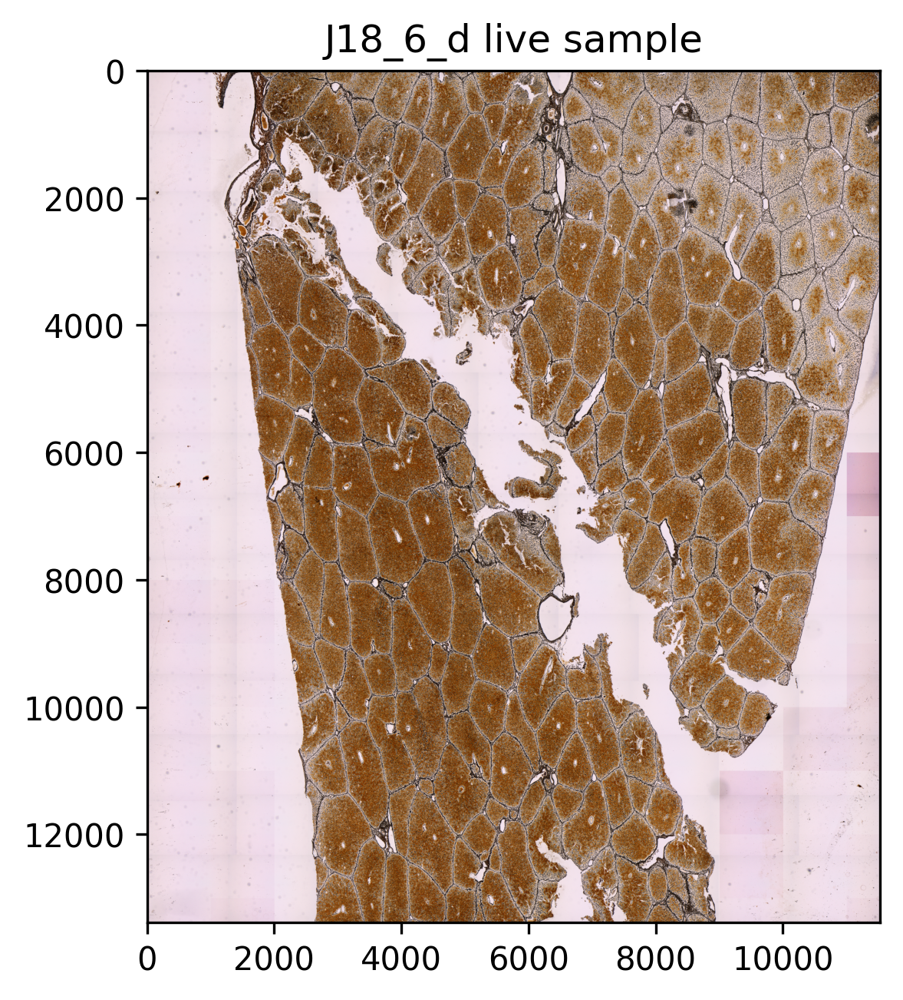

In [ ]:
plt.figure(dpi=300)
plt.imshow(merged_image)
plt.title("J18_6_d live sample")
plt.show()

Load the model

In [ ]:
model_dict = torch.load("livergan/models/fullres7_G_B.pth")

new_dict = OrderedDict()
for k, v in model_dict.items():
    # load_state_dict expects keys with prefix 'module.'
    new_dict["module." + k] = v
# make sure you pass the correct parameters to the define_G method
generator_model = define_G(input_nc=3,output_nc=3,ngf=64,netG="resnet_9blocks",
                            norm="instance",use_dropout=False,init_gain=0.02,gpu_ids=[0])
generator_model.load_state_dict(new_dict)

initialize network with normal


<All keys matched successfully>

Transform to the decellularized image domain using [livergan](https://github.com/vajavorek/livergan.git) with additional built-in post-processing

In [ ]:
process_tileB = tile_processorB(generator_model)
image = ImageSplitterMerger(fn, tilesize_px=1000, overlap_px=0, pixelsize_mm=[0.001, 0.001], fcn=process_tileB)
merged_image = image.split_and_merge_image()

2024-03-29 00:07:51.777 | DEBUG    | wsitools.image:__init__:420 - fs_enc: utf-8
2024-03-29 00:07:51.780 | DEBUG    | wsitools.image:__init__:421 - Reading file livergan/img/examples/J7_5_a.czi
2024-03-29 00:07:51.800 | DEBUG    | wsitools.image:_set_properties_czi:353 - nzi pixelsize  8.772367043811993e-07x8.772367043811993e-07 [m]
2024-03-29 00:07:51.805 | DEBUG    | wsitools.image:read_annotations:731 - Reading the annotation livergan/img/examples/J7_5_a.czi


True


Merging Tiles: 100%|██████████| 168/168 [00:00<00:00, 518.10it/s]


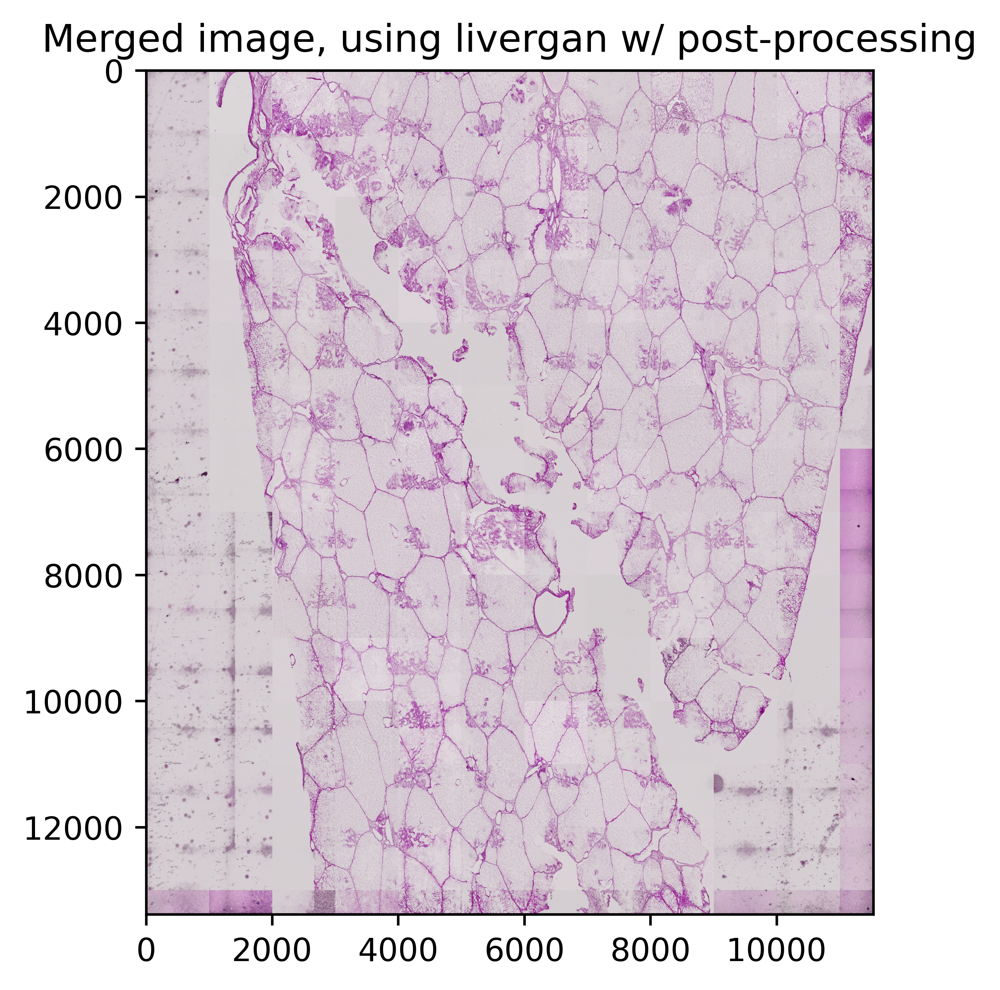

In [ ]:
plt.figure(dpi=600)
plt.imshow(merged_image)
plt.title("Merged image, using livergan w/ post-processing")
plt.show()